# Titanic Data Visualization

Today we will be visualizing the dataset "titanic.csv". Attach the file to your project directory to get started.

## Importing Libraries

First of all, we will be importing several libaries used for data visualization. This includes:
- Pandas
- Matplotlib
- Seaborn
- Klib

Kindly __INSTALL__ first these libraries before proceeding..


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import klib

## Data Loading

Firstly, we need to load our dataset, and do some data exploration and analysis.

In [2]:
df = pd.read_csv("titanic.csv")

In [3]:
df.head()

,Survived,Pclass,Name,Sex,Age,Siblings/Spouses Aboard,Parents/Children Aboard,Fare
0,0,3,Mr. Owen Harris Braund,male,22.0,1,0,7.2500
1,1,1,Mrs. John Bradley (Florence Briggs Thayer) Cum...,female,38.0,1,0,71.2833
2,1,3,Miss. Laina Heikkinen,female,26.0,0,0,7.9250
3,1,1,Mrs. Jacques Heath (Lily May Peel) Futrelle,female,35.0,1,0,53.1000
4,0,3,Mr. William Henry Allen,male,35.0,0,0,8.0500


In [4]:
df.columns

Index(['Survived', 'Pclass', 'Name', 'Sex', 'Age', 'Siblings/Spouses Aboard',
       'Parents/Children Aboard', 'Fare'],
      dtype='object')

In [5]:
df.shape

(887, 8)

We have analyzed that the age column seems to have an improper datatype, so we need to convert it into an integer.

In [6]:
df["Age"] = df["Age"].astype("int64")

In [7]:
df.dtypes

Survived                     int64
Pclass                       int64
Name                        object
Sex                         object
Age                          int64
Siblings/Spouses Aboard      int64
Parents/Children Aboard      int64
Fare                       float64
dtype: object

In [8]:
df.describe(include="all")

,Survived,Pclass,Name,Sex,Age,Siblings/Spouses Aboard,Parents/Children Aboard,Fare
count,887.000000,887.000000,887,887,887.000000,887.000000,887.000000,887.00000
unique,NaN,NaN,887,2,NaN,NaN,NaN,NaN
top,NaN,NaN,Mr. Owen Harris Braund,male,NaN,NaN,NaN,NaN
freq,NaN,NaN,1,573,NaN,NaN,NaN,NaN
mean,0.385569,2.305524,NaN,NaN,29.455468,0.525366,0.383315,32.30542
std,0.487004,0.836662,NaN,NaN,14.129919,1.104669,0.807466,49.78204
min,0.000000,1.000000,NaN,NaN,0.000000,0.000000,0.000000,0.00000
25%,0.000000,2.000000,NaN,NaN,20.000000,0.000000,0.000000,7.92500
50%,0.000000,3.000000,NaN,NaN,28.000000,0.000000,0.000000,14.45420
75%,1.000000,3.000000,NaN,NaN,38.000000,1.000000,0.000000,31.13750


In [9]:
df.isnull().any()

Survived                   False
Pclass                     False
Name                       False
Sex                        False
Age                        False
Siblings/Spouses Aboard    False
Parents/Children Aboard    False
Fare                       False
dtype: bool

In [10]:
df.duplicated().any()

False

## Data Visualization 

Now is time for us to visualize our dataset! Firstly, you can decide on a matplotlib style that you would like to use for this project.

In [11]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


In [12]:
plt.style.use('ggplot')

In fact, there are three different types of visualization:
1. Single Variable Visualization
2. Two Variable Visualization
3. Multi Variable Visualization

### 1. Single Variable Visualization

This type of visualization normally uses one variable only. Over here, I have given some examples which include:
- Histogram
- KDE Plot/Line Graph
- Displot
- Boxplot
- Countplot/Bar Graph

#### Histogram

A histogram is an approximate representation of the distribution of numerical data.

Below, we are visualizing the Age Distribution of the people riding the Titanic.

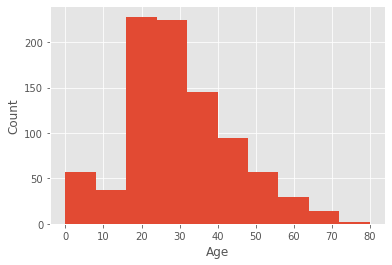

In [13]:
plt.hist(df["Age"])
plt.xlabel("Age")
plt.ylabel("Count")
plt.show()

*We can see that most of the people are of age 20-40.*

Next, we will be visualizing the Fare/Ticket Prices Distribution.

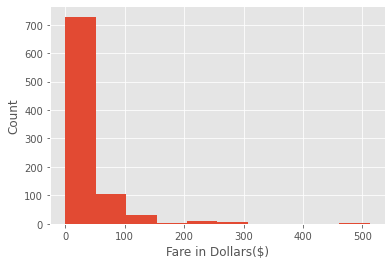

In [14]:
plt.hist(df["Fare"])
plt.xlabel("Fare in Dollars($)")
plt.ylabel("Count")
plt.show()

*We can see that most of the tickets are within the price range of 0-50 Dollars. However, there are a few outliers*

#### KDE Plot

A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset, analagous to a histogram.

We are using the seaborn library to visualize the Age Distribution on a line graph, with an additional variable included, which is Sex/Gender. This can also be deduced as Two Variable Visualization.

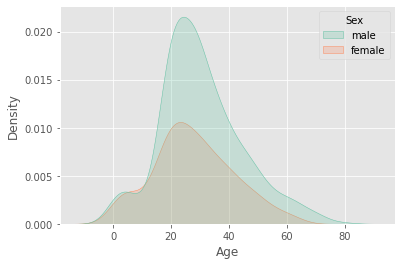

In [15]:
sns.kdeplot(x=df["Age"], hue=df["Sex"], shade=True, palette="Set2")
plt.xlabel("Age")
plt.show()

*We can see that the peak age, which means the age having the highest count for:*
- Male: 25 YO
- Female: 22 YO

#### Displot

A Distplot represents the overall distribution of continuous data variables.

Over here, we are using a special library called __Klib__ for the best visualization of Distplot.

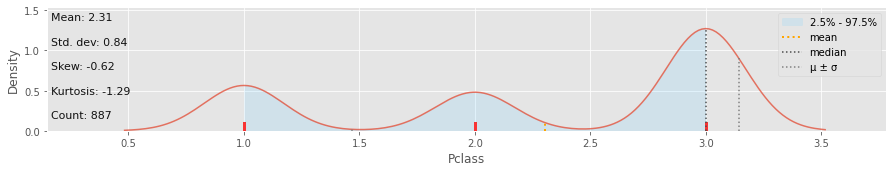

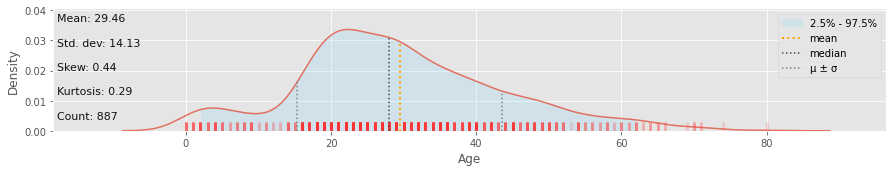

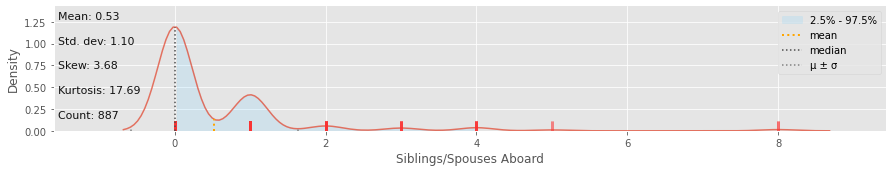

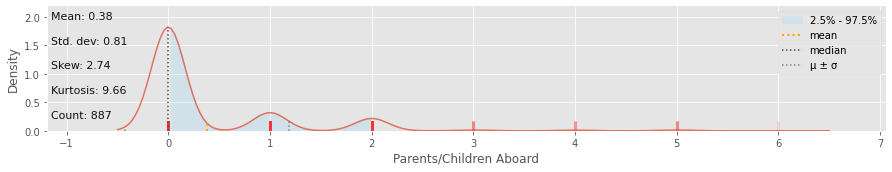

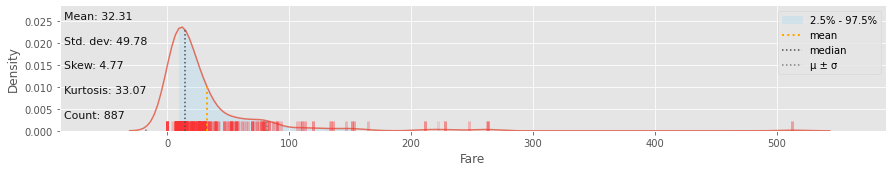

In [16]:
klib.dist_plot(df)
plt.show()

*As you can see, Klib tells us a lot of information regarding the numerical datas, we can see the distribution, mean, std, count etc.*

#### Boxplot

A box plot is a method for graphically demonstrating the locality, spread and skewness groups of numerical data through their quartiles. 

Here, we first divide the titanic dataset into three sub-DataFrames, because the Age and Fare columns have different scales compared to the other columns. This would help us to visualize better.

In [17]:
df_1 = df[['Survived', 'Pclass', 'Name', 'Sex', 'Siblings/Spouses Aboard',
                'Parents/Children Aboard']]
df_1 = df_1.rename(columns= {'Siblings/Spouses Aboard' : "SSA", 
            'Parents/Children Aboard' : "PCA"})
df_2 = df[["Fare"]]
df_3 = df[["Age"]]

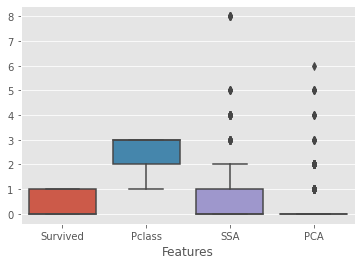

In [18]:
sns.boxplot(data=df_1)
plt.xlabel('Features')
plt.show()

*We can see these observations from the boxplot:*
- "Survived" column has only two values, either 0 or 1.
- "Pclass" columns has only three values, either 1 or 2 or 3.
- "SSA" column has a range from 0 to 8, but most of the data are concentrated from 0 to 2. 
- "PCA" column has a very varied data distribution, with a general range from 0 to 6.

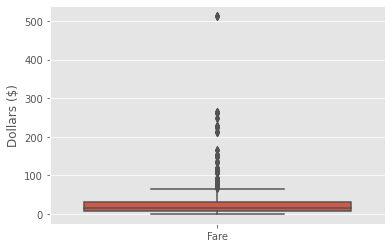

In [19]:
sns.boxplot(data=df_2)
plt.ylabel('Dollars ($)')
plt.show()

*We can observe that most of the ticket prices are at a range of 0-50 Dollars, however there are some outliers above the normal price range.*

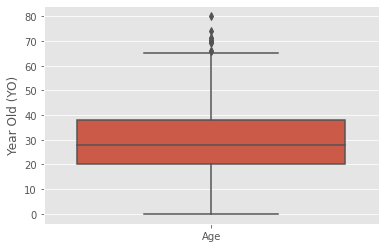

In [20]:
sns.boxplot(data=df_3)
plt.ylabel('Year Old (YO)')
plt.show()

*We can observe that most of the passengers are of age 20-40. However there are also babies and elderlies.*

Boxplots can also contain *two variable information*. In this case, we will be looking at the price range for every Pclass.

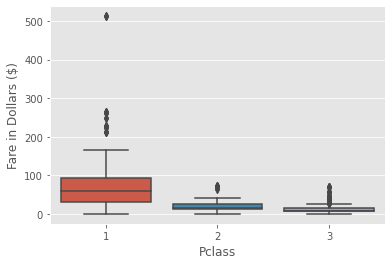

In [21]:
sns.boxplot(data=df, x=df["Pclass"], y=df["Fare"])
plt.xlabel("Pclass")
plt.ylabel("Fare in Dollars ($)")
plt.show()

*We can deduce that Pclass 1 has the highest price range, followed by Pclass 2, and Pclass 3, which have the lowest price range.*

#### Count Plot

A countplot is kind of like a histogram or a bar graph for some categorical area. It simply shows the number of occurrences of an item based on a certain type of category.

We are counting the number of people riding every Pclass.

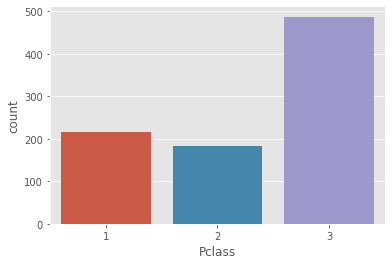

In [22]:
sns.countplot(x=df["Pclass"])
plt.show()

*We can see that most of the people ordered Pclass 3, perhaps because it's the most economical class. Moreover, there are more people who ordered Pclass 1 compared to Pclass 2, because if they want comfort and luxury, might as well spend a bit more money for Pclass 1.*

### 2. Two Variable Visualization

This type of visualization normally uses two variables. Over here, I have given some examples which include:
- Scatter Plot
- Bar Graph
- Comparative Bar Chart

#### Scatter Plot

A scatter plot is a graph in which the values of two variables are plotted along two axes, the pattern of the resulting points revealing any correlation present.

Here, we are plotting the Age and Fare variables, to see if there is any correlation that exists between them.

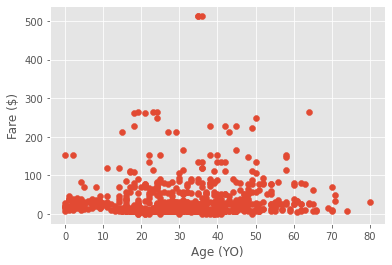

In [23]:
plt.scatter(x=df["Age"], y=df["Fare"])
plt.xlabel("Age (YO)")
plt.ylabel("Fare ($)")
plt.show()

*We can observe clearly that Age has nothing to do with Fare/ticket price. Correlation is 0 or basically no correlation.*

In addition, we can also add a new variable __Pclass__ by using the __hue__ parameter. And now we can see which particular points belong to which Pclass.

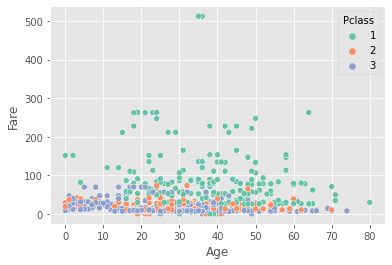

In [24]:
sns.scatterplot(data=df, x=df["Age"], y=df["Fare"], hue=df["Pclass"], palette="Set2")
plt.show()

*We can observe that Pclass 1 has the highest ticket price range in compared with the other Pclasses.*

#### Bar Graph

A bar graph is a diagram in which the numerical values of variables are represented by the height or length of lines or rectangles of equal width.

Over here, we want to visualize the average Fare for every Pclass.

First of all, we need to divide the dataframe according to every Pclass group.

In [25]:
df_pc1 = df.loc[df['Pclass'] == 1]
df_pc2 = df.loc[df['Pclass'] == 2]
df_pc3 = df.loc[df['Pclass'] == 3]

This is done to get the __mean__ value of the Fare/Ticket price in every Pclass group.

In [26]:
data = {"1" : df_pc1.Fare.mean(), 
        "2" : df_pc2.Fare.mean(),
        "3" : df_pc3.Fare.mean()}
x = list(data.keys())
y = list(data.values())

Lastly, we can plot our bar graph using __matplotlib.pyplot__

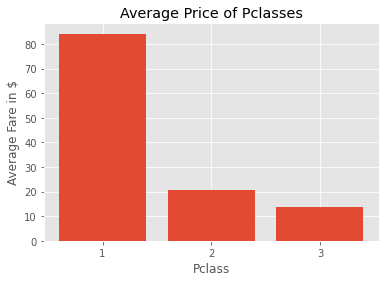

In [27]:
plt.bar(x, y)
plt.title("Average Price of Pclasses")
plt.xlabel("Pclass")
plt.ylabel("Average Fare in $")
plt.show()

*We can observe that Pclass 1 has the highest average ticket price, followed by Pclass 2 and 3.*

#### Comparative Bar Chart

A comparative bar chart places bars representing sections from the same category adjacent to each other. This allows for a quick visual comparison of the data.

Firstly, I extracted the two columns from the dataframe, which I want to visualize. Moreover, I mapped the values of the __Survived__ column, so it would be easier to read. Note:
- __0__ == DEAD
- __1__ == ALIVE

In [28]:
df_filtered = df[['Survived', 'Sex']]
df_filtered["Survived"] = df_filtered["Survived"].map({0 : "DEAD", 1 : "ALIVE"})

C:\Users\Louis J. Zhang\AppData\Local\Temp\ipykernel_8736\3518622201.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["Survived"] = df_filtered["Survived"].map({0 : "DEAD", 1 : "ALIVE"})


In [29]:
df_filtered.head()

,Survived,Sex
0,DEAD,male
1,ALIVE,female
2,ALIVE,female
3,ALIVE,female
4,DEAD,male


After that, we use seaborn to graph the __Survived__ variable, and we use the __hue__ parameter, to visualize which segments of each category are male and female.

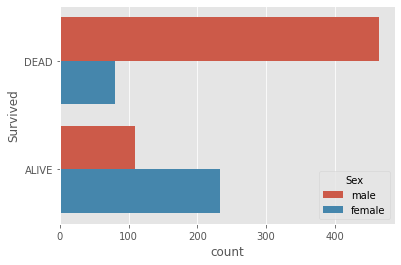

In [30]:
sns.countplot(y=df_filtered["Survived"], hue=df_filtered["Sex"])
plt.show()

*We can observe that out of those who are dead, most of them are male. On the other hand, out of those who are alive, most of them are female.*

### 3. Multiple Variable Visualization

This type of visualization normally uses more than two variables. Over here, I have given some examples which include:
- Pair Plot
- Heat Map

#### Pair Plot

Pair Plots are a really simple (one-line-of-code) way to visualize relationships between every variable in a dataframe.

We can just use the syntax below to produce a pairplot, what's needed is just specifying your **dataframe**, and an optional **hue** parameter (this is usually for categorical variable).

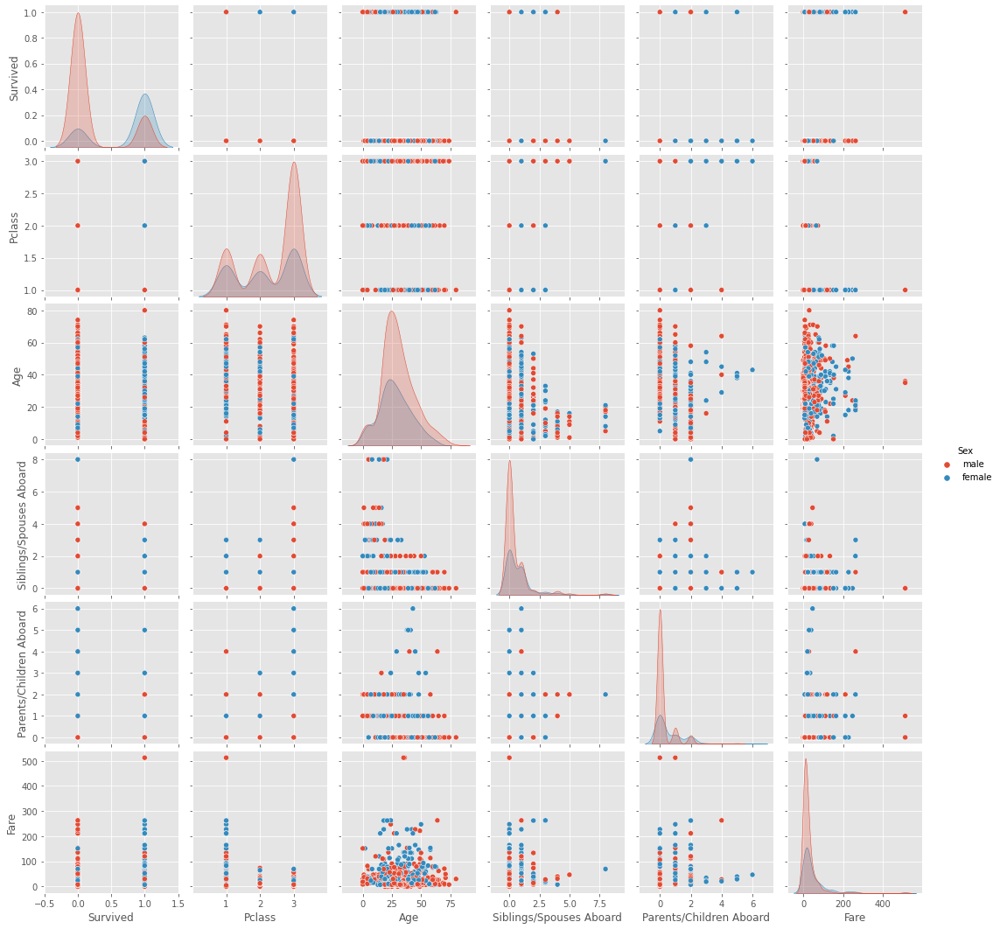

In [31]:
sns.pairplot(data=df, hue="Sex")
plt.show()

*Generally speaking, a pairplot will produce a scatter plot for every two different variables, and a KDE plot, or line graph, for every two identical variables. In addition, I have used the __Sex__ variable as a hue parameter, to divide which points/regions  in a particular graph belong to which gender.*

#### Heat Map

A heat map is a representation of data in the form of a map or diagram in which data values are represented as colors. Over here, we will be using a heat map to represent correlations between different variables.

Firstly, to tighten the space for the graph, I have renamed two columns with long names originally, into a shorter abbreviation.

In [32]:
df_copy = df.copy()
df_copy = df_copy.rename(columns={"Siblings/Spouses Aboard" : "SSA",
                            "Parents/Children Aboard" : "PCA"})
df_copy.corr()

,Survived,Pclass,Age,SSA,PCA,Fare
Survived,1.000000,-0.336528,-0.059665,-0.037082,0.080097,0.256179
Pclass,-0.336528,1.000000,-0.391572,0.085026,0.020252,-0.548919
Age,-0.059665,-0.391572,1.000000,-0.297426,-0.193976,0.112464
SSA,-0.037082,0.085026,-0.297426,1.000000,0.414244,0.158839
PCA,0.080097,0.020252,-0.193976,0.414244,1.000000,0.215470
Fare,0.256179,-0.548919,0.112464,0.158839,0.215470,1.000000


We can use the __corr()__ function from __pandas__ to display the correlation between different variables in a table.

In addition, to make it easier for us to interpret the information, it is best to visualize it in a heat map. That way the correlations are represented as colors.

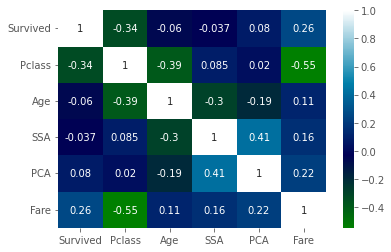

In [33]:
sns.heatmap(data=df_copy.corr(), annot=True, cmap="ocean")
plt.show()

*We can see that identical variables will obviously have a correlation of 1. Moreover, some variables are negatively corelated, whereas others are positively correlated. Some have a strong correlation, while others have a much weaker correlation.*

### DataPrep Report

In fact, there is one extraordinary library, that can help us visualize lots of information from our dataframe, through various graphs and charts.

That library is called __dataprep__ . You can check out its documentation from this link:
https://dataprep.ai/ <br>
Don't forget to __pip install dataprep__ first!

In [34]:
from dataprep.eda import create_report

We can then import the __create_report__ function from __dataprep.eda__ module. After that just call the function and pass in your __dataframe__.

The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.


  0%|          | 0/1023 [00:00<?, ?it/s]

d:\Computer Science Portfolio\AI and Machine Learning\Basic Supervised Learning\bsl\lib\site-packages\dataprep\eda\distribution\render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))


DataPrep Report
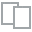
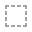
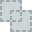
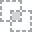
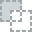
...
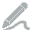
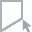
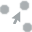
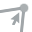
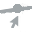

In [35]:
create_report(df)

We can analyze and interpret various information from the DataPrep Report. *FEEL FREE TO EXPLORE!!!*

### Data Saving

After we have visualized our dataframe using *matplotlib, seaborn, pandas, klib, and dataprep*, we can now save, the graphs and charts that we have created, as an image file.

We can simply use the __plt.savefig()__ syntax to save our graph. Then, specify your __file path/name__ and an optional __dpi__ paramter, where you can specify the desired resolution of your image. In addition, you can add __plt.tight_layout()__ right before __plt.savefig()__ to fit plots within your figure cleanly. However, this is an experimental feature and may not be effective for some cases. 

Below are some examples in saving different figures from different libraries. 

#### Save Distplot

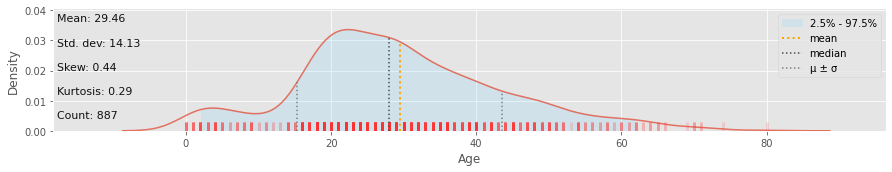

In [36]:
klib.dist_plot(df["Age"])
plt.tight_layout()
plt.savefig("dist_plot.png", dpi=300)
plt.show()

#### Save Scatter Plot

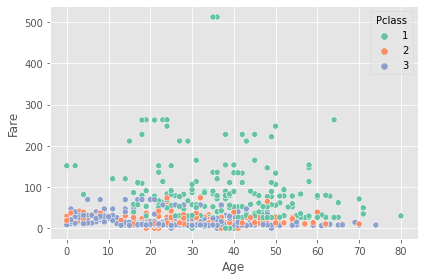

In [37]:
sns.scatterplot(data=df, x=df["Age"], y=df["Fare"], hue=df["Pclass"], palette="Set2")
plt.tight_layout()
plt.savefig("scatter_plot.png", dpi=100)
plt.show()

#### Save Heat Map

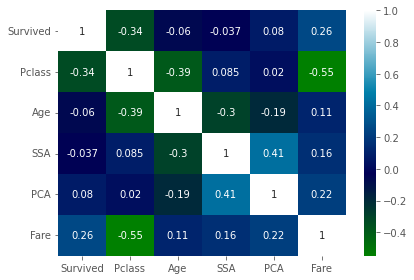

In [38]:
sns.heatmap(data=df_copy.corr(), annot=True, cmap="ocean")
plt.tight_layout()
plt.savefig("heat_map.png", dpi=200)
plt.show()

That's all for Data Visualization!